In [1]:
# load the libraries we need
import os
os.environ['USE_PYGEOS'] = '0'
import geopandas as gpd
import pandas as pd
import folium
import requests
from bs4 import BeautifulSoup
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
import libpysal
import spreg
import numpy as np
from sklearn.linear_model import ElasticNet

### load data

In [2]:
pa_gdf = gpd.read_file('C:\\Users\\Yang Hsiu Yuan\\Desktop\\RA\\collected data\\PA tiger_line_shapefiles_2020\\tl_2020_42_tract.shp')

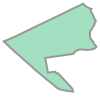

In [3]:
pa_gdf['geometry'].iloc[0]

In [4]:
allegheny_gdf = pa_gdf[pa_gdf['COUNTYFP'] == '003']
full_track_list = [103.01,103.02,201,203,305,402,404,405,406,409,501,506,509,510,511,603,605,703,705,706,708,709,802,804,806,807,809,901,902,903,1005,1011,1014,1018,
1019,1102,1106,1113,1114,1115,1203,1209,1302,1306,1307,1308,1401,1402,1403,1404,1405,1408,1411,1412,1413,1414,1516,1517,1608,1609,
1610,1702,1706,1803,1807,1903,1911,1914,1915,1916,1917,1918,1919,1920,2022,2023,2413,2509,2602,2607,2613,2614,2615,2620,2701,2703,2708,
2716,2814,2815,2901,2902,2904,3001,3102,3204,3206,3207,5619,5620,5623,5624,5625,5626,5627,5628,5629.01,5630,5631,5632.01,5632.02,5651,5652,5653,9800,9801,
9803,9804,9805,9806,9807,9808,9809,9810,9811,9812,9818,9822]
full_track_list = [str(x) for x in full_track_list]
pitt_gdf = allegheny_gdf[allegheny_gdf['NAME'].isin(full_track_list)]
pitt_gdf

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
66,42,003,050100,42003050100,501,Census Tract 501,G5020,S,790373,0,+40.4477128,-079.9728906,"POLYGON ((-79.98243 40.44649, -79.98235 40.446..."
67,42,003,070600,42003070600,706,Census Tract 706,G5020,S,289738,0,+40.4532703,-079.9254776,"POLYGON ((-79.93098 40.45206, -79.93084 40.452..."
68,42,003,080700,42003080700,807,Census Tract 807,G5020,S,275058,0,+40.4609734,-079.9343798,"POLYGON ((-79.93704 40.45777, -79.93702 40.457..."
69,42,003,090100,42003090100,901,Census Tract 901,G5020,S,672423,146361,+40.4752866,-079.9616816,"POLYGON ((-79.96868 40.47275, -79.96864 40.472..."
70,42,003,111500,42003111500,1115,Census Tract 1115,G5020,S,965267,0,+40.4622071,-079.9246392,"POLYGON ((-79.93426 40.45758, -79.93416 40.457..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3421,42,003,565100,42003565100,5651,Census Tract 5651,G5020,S,672618,0,+40.4569397,-080.0110035,"POLYGON ((-80.02011 40.45520, -80.01989 40.455..."
3422,42,003,261300,42003261300,2613,Census Tract 2613,G5020,S,1957399,0,+40.4860050,-080.0059004,"POLYGON ((-80.01783 40.49735, -80.01772 40.497..."
3423,42,003,271600,42003271600,2716,Census Tract 2716,G5020,S,1789563,0,+40.4713418,-080.0282841,"POLYGON ((-80.03786 40.47286, -80.03755 40.473..."
3424,42,003,562901,42003562901,5629.01,Census Tract 5629.01,G5020,S,2251624,585395,+40.4080909,-079.9478036,"POLYGON ((-79.95954 40.42892, -79.95920 40.429..."


<Axes: >

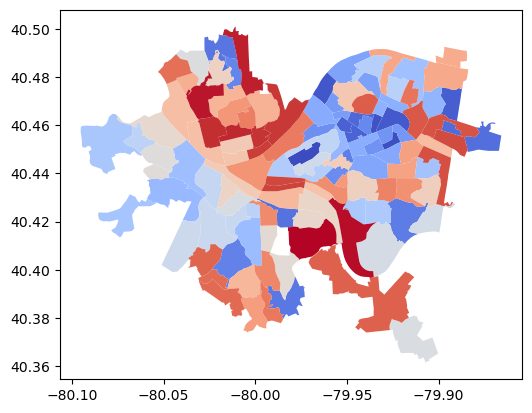

In [5]:
pitt_gdf.plot(cmap = 'coolwarm')

In [5]:
census_df = pd.read_csv('C:\\Users\\Yang Hsiu Yuan\\Desktop\\RA\\collected data\\[main] census_data_2020_v4.csv')
census_df.head()

,GEO_ID,NAME,POPULATION,NATIVE,AGE_UNDER_17,AGE_18_TO_64,AGE_OVER_65,MALE,FEMALE,ONE_RACE,...,POPULATION_DENSITY,COLLEGE_DEGREE_OR_ABOVE,bike_station_count,INTPTLAT,INTPTLON,activity_count_Q1,activity_count_Q2,activity_count_Q3,activity_count_Q4,total_activity_count
0,42003010301,"Census Tract 103.01, Allegheny County, Pennsyl...",2477,0.983851,1.0,97.3,1.7,89.2,10.8,94.1,...,0.501238,36.3,0,40.434050,-79.986430,0.0,0.0,0.0,0.0,0.0
1,42003010302,"Census Tract 103.02, Allegheny County, Pennsyl...",4101,0.937089,2.8,95.7,1.5,38.5,61.5,95.6,...,0.706265,71.8,3,40.436973,-79.985241,363.0,1439.0,1383.0,487.0,3672.0
2,42003020100,"Census Tract 201, Allegheny County, Pennsylvania",4654,0.908896,3.1,85.3,11.6,46.2,53.8,96.8,...,0.245774,93.3,17,40.440662,-80.001277,3813.0,11675.0,11931.0,3818.0,31237.0
3,42003020300,"Census Tract 203, Allegheny County, Pennsylvania",1368,0.842105,2.7,92.6,4.7,51.4,48.6,96.8,...,0.071346,95.8,8,40.454500,-79.981276,2050.0,5200.0,5359.0,1927.0,14536.0
4,42003030500,"Census Tract 305, Allegheny County, Pennsylvania",2655,0.892279,12.5,69.7,17.7,48.1,51.9,96.7,...,0.286217,59.5,1,40.442113,-79.985307,64.0,188.0,151.0,272.0,675.0


In [6]:
census_df['GEO_ID'] = census_df['GEO_ID'].astype(str)
census_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128 entries, 0 to 127
Data columns (total 74 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   GEO_ID                                128 non-null    object 
 1   NAME                                  128 non-null    object 
 2   POPULATION                            128 non-null    int64  
 3   NATIVE                                128 non-null    float64
 4   AGE_UNDER_17                          128 non-null    float64
 5   AGE_18_TO_64                          128 non-null    float64
 6   AGE_OVER_65                           128 non-null    float64
 7   MALE                                  128 non-null    float64
 8   FEMALE                                128 non-null    float64
 9   ONE_RACE                              128 non-null    float64
 10  TWO_RACES                             128 non-null    float64
 11  WHITE              

### Census Data Map

**Overview of census data**
- population density
- gender
- median income
- median house value
- education level (college degree or above)
- race

**Transportation related data**
- public transportation for work
- travel time to work

In [8]:
def draw_census_map(data, attribute, fill_color, legend):
    # starting point for pittsburgh
    m = folium.Map(location=[40.45, -79.97], zoom_start=13.48)
    
    folium.Choropleth(
    geo_data=pitt_gdf,
    name="choropleth",
    data=data,
    columns=["GEO_ID", attribute],
    key_on="feature.properties.GEOID",
    fill_color=fill_color,
    nan_fill_color = '#00000000',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name=legend,
).add_to(m)

    folium.LayerControl().add_to(m)
    return m

In [9]:
# population density
# transparent for 0
draw_census_map(census_df, "POPULATION_DENSITY", "Blues", "Population Density in Pittsburgh")

In [10]:
# gender
draw_census_map(census_df, "MALE", 'Blues', "Male Population in Pittsburgh")

In [11]:
# median income
draw_census_map(census_df, "INDIVIDUAL_INCOME_MEDIAN", 'Blues', "Individual Income (Median)")

In [12]:
# median house value
draw_census_map(census_df, "MEDIAN_HOUSE_VALUE", 'Blues', "House Value (Median)")

In [13]:
# education level
draw_census_map(census_df, "COLLEGE_DEGREE_OR_ABOVE", 'Blues', "College Degree or Above")

In [14]:
# white ratio
draw_census_map(census_df, "WHITE", 'Blues', "White Ratio")

In [15]:
# public transportation for work
draw_census_map(census_df, "WORKER_PUBLIC_TRANSPORTATION", 'Blues', "Public Transportation to Work Population")

In [16]:
# draw average travel time to work map
census_df['Average_Travel_Time'] = census_df['TRAVEL_TIME_TO_WORK_LESS_THAN_10_MIN'] * 5 + census_df['TRAVEL_TIME_TO_WORK_10_TO_14_MIN'] * 12 \
                            + census_df['TRAVEL_TIME_TO_WORK_15_TO_19_MIN'] * 17 + census_df['TRAVEL_TIME_TO_WORK_20_TO_24_MIN'] * 22 \
                            + census_df['TRAVEL_TIME_TO_WORK_25_TO_29_MIN'] * 27 + census_df['TRAVEL_TIME_TO_WORK_30_TO_34_MIN'] * 32 \
                            + census_df['TRAVEL_TIME_TO_WORK_35_TO_44_MIN'] * 40 + census_df['TRAVEL_TIME_TO_WORK_45_TO_59_MIN'] * 52 \
                            + census_df['TRAVEL_TIME_TO_WORK_MORE_THAN_60_MIN'] * 60

draw_census_map(census_df, "Average_Travel_Time", "Blues", "Average Travel Time to Work")     

### Bike Station Visualization of demand and supply

In [52]:
# load bike data 2021
station_2021Q1 = pd.read_csv("C:\\Users\\Yang Hsiu Yuan\\Desktop\\RA\\collected data\\healthy ride\\2021 Q1\\Healthy Ride Station Locations 2021 Q1.csv")
# station_2021Q1.head()
rental_2021Q1 = pd.read_csv("C:\\Users\\Yang Hsiu Yuan\\Desktop\\RA\\collected data\\healthy ride\\2021 Q1\\Healthy Ride Rentals 2021 Q1.csv")
# rental_2021Q1.head()
station_2021Q2 = pd.read_csv("C:\\Users\\Yang Hsiu Yuan\\Desktop\\RA\\collected data\\healthy ride\\2021 Q3\\Healthy Ride Station Locations Q3 2021.csv")
# station_2021Q2.head()
rental_2021Q2 = pd.read_csv("C:\\Users\\Yang Hsiu Yuan\\Desktop\\RA\\collected data\\healthy ride\\2021 Q2\\Healthy Ride Rentals - 2021 Q2.csv")
# rental_2021Q2.head()
station_2021Q3 = pd.read_csv("C:\\Users\\Yang Hsiu Yuan\\Desktop\\RA\\collected data\\healthy ride\\2021 Q3\\Healthy Ride Station Locations Q3 2021.csv")
# station_2021Q3.head()
rental_2021Q3 = pd.read_csv("C:\\Users\\Yang Hsiu Yuan\\Desktop\\RA\\collected data\\healthy ride\\2021 Q3\\Healthy Ride Rentals 2021 Q3.csv")
# rental_2021Q3.head()
station_2021Q4 = pd.read_csv("C:\\Users\\Yang Hsiu Yuan\\Desktop\\RA\\collected data\\healthy ride\\2021 Q4\\Healthy Ride Station Locations Q4 2021.csv")
# station_2021Q4.head()
rental_2021Q4 = pd.read_csv("C:\\Users\\Yang Hsiu Yuan\\Desktop\\RA\\collected data\\healthy ride\\2021 Q4\\Healthy Ride Rentals 2021 Q4.csv")
# rental_2021Q4.head()

In [53]:
# load demand supply count files
ds_2021Q1 = pd.read_csv("C:\\Users\\Yang Hsiu Yuan\\Desktop\\RA\\collected data\\healthy ride\\demand_supply_count_generated\\station_2021Q1_demand_supply.csv")
ds_2021Q2 = pd.read_csv("C:\\Users\\Yang Hsiu Yuan\\Desktop\\RA\\collected data\\healthy ride\\demand_supply_count_generated\\station_2021Q2_demand_supply.csv")
ds_2021Q3 = pd.read_csv("C:\\Users\\Yang Hsiu Yuan\\Desktop\\RA\\collected data\\healthy ride\\demand_supply_count_generated\\station_2021Q3_demand_supply.csv")
ds_2021Q4 = pd.read_csv("C:\\Users\\Yang Hsiu Yuan\\Desktop\\RA\\collected data\\healthy ride\\demand_supply_count_generated\\station_2021Q4_demand_supply.csv")

In [14]:
# demand map for bicycle station
def demand_bicycle_mon(station_df, demand_col):
    m = folium.Map(location=[40.45, -79.97], zoom_start=13.48)

    for i in range(0,len(station_df)):
        folium.Circle(
          location=[station_df.iloc[i]['Latitude'], station_df.iloc[i]['Longitude']],
          popup=station_df.iloc[i]['Station #'],
          radius=float(station_df.iloc[i][demand_col]),
          color='crimson',
          fill=True,
          fill_color='crimson',
       ).add_to(m) 

    return m

In [148]:
# supply map for bicycle station
def supply_bicycle_mon(station_df, supply_col):
    m = folium.Map(location=[40.45, -79.97], zoom_start=13.48)

    for i in range(0,len(station_df)):
        folium.Circle(
          location=[station_df.iloc[i]['Latitude'], station_df.iloc[i]['Longitude']],
          popup=station_df.iloc[i]['Station #'],
          radius=float(station_df.iloc[i][supply_col]),
          color='blue',
          fill=True,
          fill_color='blue',
       ).add_to(m)

    return m

In [15]:
demand_bicycle_mon(ds_2021Q1, "demand_count_Q1")

In [16]:
demand_bicycle_mon(ds_2021Q2, "demand_count_Q2")

In [17]:
demand_bicycle_mon(ds_2021Q3, "demand_count_Q3")

In [18]:
demand_bicycle_mon(ds_2021Q4, "demand_count_Q4")

In [154]:
supply_bicycle_mon(ds_2021Q1, "supply_count_Q1")

In [155]:
supply_bicycle_mon(ds_2021Q2, "supply_count_Q2")

In [156]:
supply_bicycle_mon(ds_2021Q3, "supply_count_Q3")

In [159]:
supply_bicycle_mon(ds_2021Q4, "supply_count_Q4")

### Spatial Regression Results

In [7]:
# calculate weights 
points = list(zip(census_df['INTPTLAT'], census_df['INTPTLON']))
W=libpysal.weights.DistanceBand(points,threshold=11.2,binary=False)

E:\Anaconda3\lib\site-packages\scipy\sparse\_data.py:117: RuntimeWarning: divide by zero encountered in reciprocal
  return self._with_data(data ** n)


#### number of stations vs census features

**run on all features first**

In [8]:
# full features first
# get X and y (for full set)
feature_cols = ['POPULATION_DENSITY', "AGE_UNDER_17", "AGE_18_TO_64", "AGE_OVER_65", "MALE", 'WHITE', 
                "BLACK_AFRICAN_AMERICAN", "AMERICAN_INDIAN_ALASKA_NATIVE", "ASIAN", "HAWAIIAN_PACIFIC", 
                "HISPANIC_LATINO", "LANGUAGE_OTHER_THAN_ENGLISH", 'MEDIAN_HOUSE_VALUE', 
                'COLLEGE_DEGREE_OR_ABOVE', "INDIVIDUAL_INCOME_MEDIAN", "WORKER_NOT_WFH", 
                "WORKER_DEPART_0000_0559", "WORKER_DEPART_0600_0729", "WORKER_DEPART_0730_0859", "WORKER_DEPART_0900_2359",
                "TRAVEL_TIME_TO_WORK_LESS_THAN_10_MIN", 'TRAVEL_TIME_TO_WORK_10_TO_14_MIN', 
                'TRAVEL_TIME_TO_WORK_15_TO_19_MIN', 'TRAVEL_TIME_TO_WORK_20_TO_24_MIN',
                'TRAVEL_TIME_TO_WORK_25_TO_29_MIN', 'TRAVEL_TIME_TO_WORK_30_TO_34_MIN',
                'TRAVEL_TIME_TO_WORK_35_TO_44_MIN', 'TRAVEL_TIME_TO_WORK_45_TO_59_MIN',
                'TRAVEL_TIME_TO_WORK_MORE_THAN_60_MIN', 'WORKER_VEHICLE_DROVE_ALONE',
                'WORKER_VEHICLE_CARPOOL', 'WORKER_PUBLIC_TRANSPORTATION', 'POVERTY', 'DISABILITY']
X = census_df[feature_cols].values

# standardization first
scaler = StandardScaler()
X = scaler.fit_transform(X)
y = census_df.bike_station_count.values

ols_spreg = spreg.OLS(y, X, w=W, spat_diag=True, moran = True)
print(ols_spreg.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :     dep_var                Number of Observations:         128
Mean dependent var  :      0.7812                Number of Variables   :          35
S.D. dependent var  :      1.9398                Degrees of Freedom    :          93
R-squared           :      0.7514
Adjusted R-squared  :      0.6605
Sum squared residual:     118.809                F-statistic           :      8.2667
Sigma-square        :       1.278                Prob(F-statistic)     :   2.867e-16
S.E. of regression  :       1.130                Log likelihood        :    -176.855
Sigma-square ML     :       0.928                Akaike info criterion :     423.710
S.E of regression ML:      0.9634                Schwarz criterion     :     523.531

-----------------------------------------------------------------------------

In [9]:
# filter out significant coefficients (i.e. 8, 15, 16, 30, 31, 32, 33)
# get X and y 
feature_cols = ["AMERICAN_INDIAN_ALASKA_NATIVE","INDIVIDUAL_INCOME_MEDIAN", "WORKER_NOT_WFH", 'WORKER_VEHICLE_DROVE_ALONE',
                'WORKER_VEHICLE_CARPOOL', 'WORKER_PUBLIC_TRANSPORTATION', 'POVERTY']
X = census_df[feature_cols].values

# standardization first
scaler = StandardScaler()
X = scaler.fit_transform(X)
y = census_df.bike_station_count.values

ols_spreg = spreg.OLS(y, X, w=W, spat_diag=True, moran = True)
print(ols_spreg.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :     dep_var                Number of Observations:         128
Mean dependent var  :      0.7812                Number of Variables   :           8
S.D. dependent var  :      1.9398                Degrees of Freedom    :         120
R-squared           :      0.6012
Adjusted R-squared  :      0.5780
Sum squared residual:     190.553                F-statistic           :     25.8486
Sigma-square        :       1.588                Prob(F-statistic)     :   2.861e-21
S.E. of regression  :       1.260                Log likelihood        :    -207.090
Sigma-square ML     :       1.489                Akaike info criterion :     430.179
S.E of regression ML:      1.2201                Schwarz criterion     :     452.996

-----------------------------------------------------------------------------

#### activity per station vs # of stations and census features

In [48]:
# full features first
# get X and y (for full set)
feature_cols = ['POPULATION_DENSITY', "AGE_UNDER_17", "AGE_18_TO_64", "AGE_OVER_65", "MALE", 'WHITE', 
                "BLACK_AFRICAN_AMERICAN", "AMERICAN_INDIAN_ALASKA_NATIVE", "ASIAN", "HAWAIIAN_PACIFIC", 
                "HISPANIC_LATINO", "LANGUAGE_OTHER_THAN_ENGLISH", 'MEDIAN_HOUSE_VALUE', 
                'COLLEGE_DEGREE_OR_ABOVE', "INDIVIDUAL_INCOME_MEDIAN", "WORKER_NOT_WFH", 
                "WORKER_DEPART_0000_0559", "WORKER_DEPART_0600_0729", "WORKER_DEPART_0730_0859", "WORKER_DEPART_0900_2359",
                "TRAVEL_TIME_TO_WORK_LESS_THAN_10_MIN", 'TRAVEL_TIME_TO_WORK_10_TO_14_MIN', 
                'TRAVEL_TIME_TO_WORK_15_TO_19_MIN', 'TRAVEL_TIME_TO_WORK_20_TO_24_MIN',
                'TRAVEL_TIME_TO_WORK_25_TO_29_MIN', 'TRAVEL_TIME_TO_WORK_30_TO_34_MIN',
                'TRAVEL_TIME_TO_WORK_35_TO_44_MIN', 'TRAVEL_TIME_TO_WORK_45_TO_59_MIN',
                'TRAVEL_TIME_TO_WORK_MORE_THAN_60_MIN', 'WORKER_VEHICLE_DROVE_ALONE',
                'WORKER_VEHICLE_CARPOOL', 'WORKER_PUBLIC_TRANSPORTATION', 'POVERTY', 'DISABILITY', 'bike_station_count']
X = census_df[feature_cols].values

# standardization first
scaler = StandardScaler()
X = scaler.fit_transform(X)
avg_count = np.array(census_df['total_activity_count']/census_df['bike_station_count'])
avg_count = np.nan_to_num(avg_count, nan=0)
y = avg_count

ols_spreg = spreg.OLS(y, X, w=W, spat_diag=True, moran = True)
print(ols_spreg.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :     dep_var                Number of Observations:         128
Mean dependent var  :    607.0060                Number of Variables   :          36
S.D. dependent var  :   1036.6933                Degrees of Freedom    :          92
R-squared           :      0.5012
Adjusted R-squared  :      0.3114
Sum squared residual:68086792.025                F-statistic           :      2.6408
Sigma-square        :  740073.826                Prob(F-statistic)     :   0.0001141
S.E. of regression  :     860.275                Log likelihood        :   -1025.417
Sigma-square ML     :  531928.063                Akaike info criterion :    2122.834
S.E of regression ML:    729.3340                Schwarz criterion     :    2225.507

-----------------------------------------------------------------------------

In [45]:
# remove bike station counts
# get X and y
feature_cols = ['POPULATION_DENSITY', "AGE_UNDER_17", "AGE_18_TO_64", "AGE_OVER_65", "MALE", 'WHITE', 
                "BLACK_AFRICAN_AMERICAN", "AMERICAN_INDIAN_ALASKA_NATIVE", "ASIAN", "HAWAIIAN_PACIFIC", 
                "HISPANIC_LATINO", "LANGUAGE_OTHER_THAN_ENGLISH", 'MEDIAN_HOUSE_VALUE', 
                'COLLEGE_DEGREE_OR_ABOVE', "INDIVIDUAL_INCOME_MEDIAN", "WORKER_NOT_WFH", 
                "WORKER_DEPART_0000_0559", "WORKER_DEPART_0600_0729", "WORKER_DEPART_0730_0859", "WORKER_DEPART_0900_2359",
                "TRAVEL_TIME_TO_WORK_LESS_THAN_10_MIN", 'TRAVEL_TIME_TO_WORK_10_TO_14_MIN', 
                'TRAVEL_TIME_TO_WORK_15_TO_19_MIN', 'TRAVEL_TIME_TO_WORK_20_TO_24_MIN',
                'TRAVEL_TIME_TO_WORK_25_TO_29_MIN', 'TRAVEL_TIME_TO_WORK_30_TO_34_MIN',
                'TRAVEL_TIME_TO_WORK_35_TO_44_MIN', 'TRAVEL_TIME_TO_WORK_45_TO_59_MIN',
                'TRAVEL_TIME_TO_WORK_MORE_THAN_60_MIN', 'WORKER_VEHICLE_DROVE_ALONE',
                'WORKER_VEHICLE_CARPOOL', 'WORKER_PUBLIC_TRANSPORTATION', 'POVERTY', 'DISABILITY']
X = census_df[feature_cols].values

# standardization first
scaler = StandardScaler()
X = scaler.fit_transform(X)
avg_count = np.array(census_df['total_activity_count']/census_df['bike_station_count'])
avg_count = np.nan_to_num(avg_count, nan=0)
y = avg_count

ols_spreg = spreg.OLS(y, X, w=W, spat_diag=True, moran = True)
print(ols_spreg.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :     dep_var                Number of Observations:         128
Mean dependent var  :    607.0060                Number of Variables   :          35
S.D. dependent var  :   1036.6933                Degrees of Freedom    :          93
R-squared           :      0.4726
Adjusted R-squared  :      0.2798
Sum squared residual:71984078.099                F-statistic           :      2.4512
Sigma-square        :  774022.345                Prob(F-statistic)     :   0.0003678
S.E. of regression  :     879.785                Log likelihood        :   -1028.979
Sigma-square ML     :  562375.610                Akaike info criterion :    2127.959
S.E of regression ML:    749.9171                Schwarz criterion     :    2227.780

-----------------------------------------------------------------------------

### Bike station counts versus spatial reg results

In [181]:
def draw_census_map_bicycle_counts(data, attribute, fill_color, legend):
    # starting point for pittsburgh
    
    m = folium.Map(location=[40.45, -79.97], zoom_start=13.48)
    folium.Choropleth(
    geo_data=pitt_gdf,
    name="choropleth",
    data=data,
    columns=["GEO_ID", attribute],
    key_on="feature.properties.GEOID",
    fill_color=fill_color,
    nan_fill_color = '#00000000',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name=legend,
).add_to(m)

#     folium.LayerControl().add_to(m)
    for i in range(0,len(data)):
        if data.iloc[i]['bike_station_count'] == 0:
            continue
        else:
            folium.Circle(
              location=[data.iloc[i]['INTPTLAT'], data.iloc[i]['INTPTLON']],
              popup=data.iloc[i]['bike_station_count'],
              radius=float(data.iloc[i]['bike_station_count']*10),
              color='crimson',
              fill=True,
              fill_color= 'crimson', 
              nan_fill_color = '#00000000'
           ).add_to(m) 
    folium.LayerControl().add_to(m)    
    return m

In [182]:
# AMERICAN_INDIAN_ALASKA_NATIVE
draw_census_map_bicycle_counts(census_df, "AMERICAN_INDIAN_ALASKA_NATIVE", "Greens", "American Indian Alaska Native Ratio")

In [183]:
# income (median)
draw_census_map_bicycle_counts(census_df, "INDIVIDUAL_INCOME_MEDIAN", "Greens", "Individual Income (Median)")

In [184]:
# WORKER_NOT_WFH
draw_census_map_bicycle_counts(census_df, "WORKER_NOT_WFH", "Greens", "Worker Not WFH")

In [185]:
# WORKER_VEHICLE_DROVE_ALONE
draw_census_map_bicycle_counts(census_df, "WORKER_VEHICLE_DROVE_ALONE", "Greens", "Worker Vehicle Drove Alone")

In [186]:
# WORKER_VEHICLE_CARPOOL
draw_census_map_bicycle_counts(census_df, "WORKER_VEHICLE_CARPOOL", "Greens", "Worker Vehicle Carpool")

In [187]:
# WORKER_PUBLIC_TRANSPORTATION
draw_census_map_bicycle_counts(census_df, "WORKER_PUBLIC_TRANSPORTATION", "Greens", "Worker Public Transportation")

In [188]:
# POVERTY
draw_census_map_bicycle_counts(census_df, "POVERTY", "Greens", "Poverty")

### Elastic Net Regression Results

#### number of stations vs census features

In [20]:
from scipy.stats import t
# full features first
# get X and y (for full set)
feature_cols = ['POPULATION_DENSITY', "AGE_UNDER_17", "AGE_18_TO_64", "AGE_OVER_65", "MALE", 'WHITE', 
                "BLACK_AFRICAN_AMERICAN", "AMERICAN_INDIAN_ALASKA_NATIVE", "ASIAN", "HAWAIIAN_PACIFIC", 
                "HISPANIC_LATINO", "LANGUAGE_OTHER_THAN_ENGLISH", 'MEDIAN_HOUSE_VALUE', 
                'COLLEGE_DEGREE_OR_ABOVE', "INDIVIDUAL_INCOME_MEDIAN", "WORKER_NOT_WFH", 
                "WORKER_DEPART_0000_0559", "WORKER_DEPART_0600_0729", "WORKER_DEPART_0730_0859", "WORKER_DEPART_0900_2359",
                "TRAVEL_TIME_TO_WORK_LESS_THAN_10_MIN", 'TRAVEL_TIME_TO_WORK_10_TO_14_MIN', 
                'TRAVEL_TIME_TO_WORK_15_TO_19_MIN', 'TRAVEL_TIME_TO_WORK_20_TO_24_MIN',
                'TRAVEL_TIME_TO_WORK_25_TO_29_MIN', 'TRAVEL_TIME_TO_WORK_30_TO_34_MIN',
                'TRAVEL_TIME_TO_WORK_35_TO_44_MIN', 'TRAVEL_TIME_TO_WORK_45_TO_59_MIN',
                'TRAVEL_TIME_TO_WORK_MORE_THAN_60_MIN', 'WORKER_VEHICLE_DROVE_ALONE',
                'WORKER_VEHICLE_CARPOOL', 'WORKER_PUBLIC_TRANSPORTATION', 'POVERTY', 'DISABILITY']
X = census_df[feature_cols].values

# standardization first
scaler = StandardScaler()
X = scaler.fit_transform(X)
y = census_df.bike_station_count.values

# create elastic net model
enet_model = ElasticNet(alpha=0.1, l1_ratio=0.4, fit_intercept=False)
enet_results = enet_model.fit(X, y)

In [21]:
# calculate R-squared
r_squared = enet_model.score(X, y)

# calculate p-values
n = len(y)
p = X.shape[1]
rss = np.sum((y - enet_model.predict(X))**2)
se = np.sqrt(rss / (n - p) / np.diag(np.dot(X.T, X)))

# Calculate t-values and p-values
t_values = enet_model.coef_ / se
p_values = 2 * t.cdf(-np.abs(t_values), n - p)

# display results
print("Elastic Net Results:")
print("R-squared: {:.3f}".format(r_squared))
print('{:<40} {:10} {:10} {:10}'.format('feature', 'coefficient','t-value','p-value'))
for feature, coef, t, p in zip(feature_cols, enet_results.coef_, t_values, p_values):
    print('{:<40} {:10} {:10} {:10}'.format(feature, np.round(coef, 6), np.round(t, 4), np.round(p, 4)))

Elastic Net Results:
R-squared: 0.418
feature                                  coefficient t-value    p-value   
POPULATION_DENSITY                        -0.060146    -0.3956     0.6933
AGE_UNDER_17                              -0.451344    -2.9684     0.0038
AGE_18_TO_64                               0.086754     0.5706     0.5697
AGE_OVER_65                               -0.316266      -2.08     0.0402
MALE                                      -0.100338    -0.6599     0.5109
WHITE                                     -0.095409    -0.6275     0.5319
BLACK_AFRICAN_AMERICAN                     0.144822     0.9525     0.3433
AMERICAN_INDIAN_ALASKA_NATIVE             -0.167312    -1.1004      0.274
ASIAN                                      0.060513      0.398     0.6915
HAWAIIAN_PACIFIC                          -0.013112    -0.0862     0.9315
HISPANIC_LATINO                                -0.0       -0.0        1.0
LANGUAGE_OTHER_THAN_ENGLISH                    -0.0       -0.0        1.0

#### activity per station vs # of stations and census features

In [48]:
from scipy.stats import t
# full features first
# get X and y (for full set)
feature_cols = ['POPULATION_DENSITY', "AGE_UNDER_17", "AGE_18_TO_64", "AGE_OVER_65", "MALE", 'WHITE', 
                "BLACK_AFRICAN_AMERICAN", "AMERICAN_INDIAN_ALASKA_NATIVE", "ASIAN", "HAWAIIAN_PACIFIC", 
                "HISPANIC_LATINO", "LANGUAGE_OTHER_THAN_ENGLISH", 'MEDIAN_HOUSE_VALUE', 
                'COLLEGE_DEGREE_OR_ABOVE', "INDIVIDUAL_INCOME_MEDIAN", "WORKER_NOT_WFH", 
                "WORKER_DEPART_0000_0559", "WORKER_DEPART_0600_0729", "WORKER_DEPART_0730_0859", "WORKER_DEPART_0900_2359",
                "TRAVEL_TIME_TO_WORK_LESS_THAN_10_MIN", 'TRAVEL_TIME_TO_WORK_10_TO_14_MIN', 
                'TRAVEL_TIME_TO_WORK_15_TO_19_MIN', 'TRAVEL_TIME_TO_WORK_20_TO_24_MIN',
                'TRAVEL_TIME_TO_WORK_25_TO_29_MIN', 'TRAVEL_TIME_TO_WORK_30_TO_34_MIN',
                'TRAVEL_TIME_TO_WORK_35_TO_44_MIN', 'TRAVEL_TIME_TO_WORK_45_TO_59_MIN',
                'TRAVEL_TIME_TO_WORK_MORE_THAN_60_MIN', 'WORKER_VEHICLE_DROVE_ALONE',
                'WORKER_VEHICLE_CARPOOL', 'WORKER_PUBLIC_TRANSPORTATION', 'POVERTY', 'DISABILITY', 'bike_station_count']
X = census_df[feature_cols].values

# standardization first
scaler = StandardScaler()
X = scaler.fit_transform(X)
avg_count = np.array(census_df['total_activity_count']/census_df['bike_station_count'])
avg_count = np.nan_to_num(avg_count, nan=0)
y = avg_count

# create elastic net model
enet_model = ElasticNet(alpha=0.01, l1_ratio=0.5, fit_intercept=False)
enet_results = enet_model.fit(X, y)

In [49]:
# calculate R-squared
r_squared = enet_model.score(X, y)

# calculate p-values
n = len(y)
p = X.shape[1]
rss = np.sum((y - enet_model.predict(X))**2)
se = np.sqrt(rss / (n - p) / np.diag(np.dot(X.T, X)))

# Calculate t-values and p-values
t_values = enet_model.coef_ / se
p_values = 2 * t.cdf(-np.abs(t_values), n - p)

# display results
print("Elastic Net Results:")
print("R-squared: {:.3f}".format(r_squared))
print('{:<40} {:10} {:10} {:10}'.format('feature', 'coefficient','t-value','p-value'))
for feature, coef, t, p in zip(feature_cols, enet_results.coef_, t_values, p_values):
    print('{:<40} {:10} {:10} {:10}'.format(feature, np.round(coef, 6), np.round(t, 4), np.round(p, 4)))

Elastic Net Results:
R-squared: 0.153
feature                                  coefficient t-value    p-value   
POPULATION_DENSITY                        115.78167     1.1747     0.2431
AGE_UNDER_17                             -299.768584    -3.0413     0.0031
AGE_18_TO_64                             -215.43079    -2.1856     0.0314
AGE_OVER_65                              -236.847874    -2.4029     0.0182
MALE                                       2.219528     0.0225     0.9821
WHITE                                    164.121597     1.6651     0.0993
BLACK_AFRICAN_AMERICAN                    -6.743297    -0.0684     0.9456
AMERICAN_INDIAN_ALASKA_NATIVE             50.776635     0.5152     0.6077
ASIAN                                    135.577029     1.3755     0.1723
HAWAIIAN_PACIFIC                         -25.100209    -0.2547     0.7996
HISPANIC_LATINO                          -41.454163    -0.4206      0.675
LANGUAGE_OTHER_THAN_ENGLISH              -31.761178    -0.3222      0.7